In [1]:
#!/usr/bin/env python
# coding: utf-8

# # Creating an optimisation with meta parameters
# 
# This notebook will explain how to set up an optimisation that uses metaparameters (parameters that control other parameters)


import bluepyopt as bpop
import bluepyopt.ephys as ephys
import pickle
from sciunit.scores import ZScore
from sciunit import TestSuite
from sciunit.scores.collections import ScoreArray
import sciunit
import numpy as np
from neuronunit.optimisation.optimization_management import dtc_to_rheo, switch_logic,active_values
from neuronunit.tests.base import AMPL, DELAY, DURATION

import quantities as pq
PASSIVE_DURATION = 500.0*pq.ms
PASSIVE_DELAY = 200.0*pq.ms
import matplotlib.pyplot as plt
from bluepyopt.ephys.models import ReducedCellModel
import numpy
from neuronunit.optimisation.optimization_management import test_all_objective_test
from neuronunit.optimisation.optimization_management import check_binary_match, three_step_protocol,inject_and_plot_passive_model
from neuronunit.optimisation.model_parameters import MODEL_PARAMS
import copy
'''
MODEL_PARAMS["IZHI"].pop('C',None)
MODEL_PARAMS["IZHI"].pop('k',None)
#MODEL_PARAMS["IZHI"].pop('vPeak',None)
MODEL_PARAMS["IZHI"].pop('vt',None)
#MODEL_PARAMS["IZHI"].pop('a',None)
MODEL_PARAMS["IZHI"].pop('d',None)
#MODEL_PARAMS["IZHI"].pop('vr',None)
#MODEL_PARAMS["IZHI"].pop('c',None)
'''
#MODEL_PARAMS["IZHI"].pop('C',None)
#MODEL_PARAMS["IZHI"].pop('k',None)

import numpy as np


simple_cell = ephys.models.ReducedCellModel(
        name='simple_cell',
        params=MODEL_PARAMS["IZHI"],backend="IZHI")  
simple_cell.backend = "IZHI"


# First we need to import the module that contains all the functionality to create electrical cell models

# If you want to see a lot of information about the internals, 
# the verbose level can be set to 'debug' by commenting out
# the following lines

# Setting up the cell
# ---------------------
# This is very similar to the simplecell example in the directory above. For a more detailed explanation, look there.

# For this example we will create two separate parameters to store the specific capacitance. One for the soma and one for the soma. We will put a metaparameter on top of these two to keep the value between soma and axon the same.

# The metaparameter, the one that will be optimised, will make sure the two parameters above keep always the same value

# And parameters that represent the maximal conductance of the sodium and potassium channels. These two parameters will be not be optimised but are frozen.

# ### Creating the template
# 
# To create the cell template, we pass all these objects to the constructor of the template.
# We *only* put the metaparameter, not its subparameters.


simple_cell = ephys.models.ReducedCellModel(
        name='simple_cell',
        params=MODEL_PARAMS["IZHI"],backend="IZHI")  
simple_cell.backend = "IZHI"


# Now we can print out a description of the cell

model = simple_cell
model.params = {k:np.mean(v) for k,v in model.params.items() }
from make_allen_tests import AllenTest

from sciunit.scores import ZScore
tests = pickle.load(open("processed_multicellular_constraints.p","rb"))
nu_tests = tests['Hippocampus CA1 pyramidal cell'].tests
nu_tests[0].score_type = ZScore

simulated_experiment = True
features = None
allen = True
from collections.abc import Iterable

if simulated_experiment:
    while features is None:
        aug_nu_tests, OM, target = test_all_objective_test(MODEL_PARAMS["IZHI"],model_type="IZHI",protocol={'allen':False,'elephant':True})
        target = three_step_protocol(target)
        if hasattr(target,'everything'):
            features = copy.copy(target.everything)
            
            check_list = {key:feat for key,feat in features.items() if not feat is None and type(feat) is not type(Iterable) and feat !=0 and feat !=1 }
            check_list.pop('depol_block_1.5x',None)
            check_list.pop('is_not_stuck_3.0x',None)
            check_list.pop('is_not_stuck_1.5x',None)
            scale = 2.0/len(check_list)
            if scale > 0.009999:
                print('not high enough definition')
                features = None
                continue
            
            if allen:
                simple_cell.allen = None
                simple_cell.allen = True

                tests = pickle.load(open("allen_NU_tests.p","rb"))
                print('allen cell',tests[0].name)
                nu_tests = tests[0]
                for t in nu_tests:
                    to_pop = []
                    if t.name in features.keys():
                        if features[t.name] is not None:
                            t.set_observation(features[t.name])
                            if t.observation['mean'] is not None:
                                t.observation['std'] = np.abs(np.mean(t.observation['mean']))
                        to_pop.append(t.name)
                        
                    [ features.pop(i,None) for i in to_pop ]
                '''
                more_tests = []
                for feat in features:    
                    if feat is not None:
                        at = AllenTest(name=feat)
                        at.set_observation(features[at.name])
                        if at.observation['mean'] is not None:
                            at.observation['std'] = np.abs(np.mean(t.observation['mean']))
                            more_tests.append(at)
                features = copy.copy(target.everything)
                nu_tests = [t for t in nu_tests.tests]
                nu_tests.extend(more_tests)
                
                '''
                    

/home/user/anaconda3/lib/python3.7/site-packages/airspeed/__init__.py:505: FutureWarning: Possible nested set at position 8
  KEYVALSEP = re.compile(r'[ \t]*:[[ \t]*(.*)$', re.S)


Random simulated data tests made
{'value': array(183.80039614) * pA}
{'value': array(3.18885133) * ms}
{'mean': array(-69.7309259) * mV, 'std': array(1.42108547e-14) * mV}
{'value': array(29675762.36211471) * kg*m**2/(s**3*A**2)}
{'value': array(1.07456425e-10) * s**4*A**2/(kg*m**2)}
{'mean': array(0.0003) * s, 'std': array(0.) * s, 'n': 1}
{'value': array(60.15130525) * mV, 'mean': array(60.15130525) * mV, 'std': array(0.) * mV, 'n': 1}
{'mean': array(-17.5098336) * mV, 'std': array(0.) * mV, 'n': 1}
allen cell 504615116


In [2]:
features = target.everything


for key,feat in features.items():
    if isinstance(feat, int):
        print(key,feat)
features
nu_tests;

In [3]:

big_list = []
for tt in aug_nu_tests.values():
    tt.core = None
    tt.core = True
    big_list.append(tt)
big_list.extend(nu_tests)
nu_tests = big_list


In [4]:
#big_list = []
#for tt in nu_tests:
#    big_list.append(tt)
#big_list.extend(more_tests)
#nu_tests = big_list
#    feature_name = '%s' % (tt.name)
#    print(feature_name)
import efel
import pandas as pd
import seaborn as sns
list(efel.getFeatureNames());

def basic_expVar(trace1, trace2):
    # https://github.com/AllenInstitute/GLIF_Teeter_et_al_2018/blob/master/query_biophys/query_biophys_expVar.py
    '''This is the fundamental calculation that is used in all different types of explained variation.  
    At a basic level, the explained variance is calculated between two traces.  These traces can be PSTH's
    or single spike trains that have been convolved with a kernel (in this case always a Gaussian)
    Input:
        trace 1 & 2:  1D numpy array containing values of the trace.  (This function requires numpy array
                        to ensure that this is not a multidemensional list.)
    Returns:
        expVar:  float value of explained variance
    '''
    
    var_trace1=np.var(trace1)
    var_trace2=np.var(trace2)
    var_trace1_minus_trace2=np.var(trace1-trace2)

    if var_trace1_minus_trace2 == 0.0:
        return 1.0
    else:
        return (var_trace1+var_trace2-var_trace1_minus_trace2)/(var_trace1+var_trace2)

In [5]:
 
class NUFeatureAllen(object):
    def __init__(self,test,model,cnt,target,check_list,spike_obs,print_stuff=False):
        self.test = test
        self.model = model
        self.check_list = check_list
        self.spike_obs = spike_obs
        self.cnt = cnt
        self.target = target
        self.print_stuff = print_stuff
    def calculate_score(self,responses):
        if not 'features' in responses.keys():# or not 'model' in responses.keys():
            return 100.0
        check_list = self.check_list

    
        features = responses['features']

        
        feature_name = self.test.name
        if feature_name not in features.keys():
            return 100.0
        
        if features[feature_name] is None:
            return 100.0
            
        if type(features[self.test.name]) is type(Iterable):
            features[self.test.name] = np.mean(features[self.test.name])
        self.test.observation['std'] = np.abs(np.mean(self.test.observation['mean']))
        self.test.observation['mean'] = np.mean(self.test.observation['mean'])            
        self.test.set_prediction(np.mean(features[self.test.name]))
        
        if 'Spikecount_3.0x'==self.test.name or 'Spikecount_1.5x'==self.test.name:
            if features[feature_name] is None:
                return 100.0
            delta = np.abs(features[self.test.name]-np.mean(self.test.observation['mean']))

            
            return delta
        else:
            delta0 = np.abs(features['Spikecount_3.0x']-np.mean(self.spike_obs[0]['mean']))
            delta1 = np.abs(features['Spikecount_1.5x']-np.mean(self.spike_obs[1]['mean']))
            #if self.print_stuff:
            #    print(features['Spikecount_3.0x'],np.mean(self.spike_obs[0]['mean']))
            #    print(features['Spikecount_1.5x'],np.mean(self.spike_obs[1]['mean']))


            #else:

            #if hasattr(self.test,'core'):
            #    score = self.calculate_score_core(responses)
            #    score = 0.000925*score
            #    return score 
            '''
            if self.cnt==287:# 286 spike_width2_3.0x
                delta0 = 0.03*(1.0-float(basic_expVar(responses['dtc'].vm15,self.target.vm15)))
                delta1 = 0.03*(1.0-float(basic_expVar(responses['dtc'].vm30,self.target.vm30)))
                return delta0+delta1
            if self.cnt==286:
                delta = 0.03*(1.0-basic_expVar(responses['dtc'].vmrh,self.target.vmrh))
                return float(delta)                
            print(self.cnt,feature_name)
            '''

            if feature_name in check_list:
                if features[feature_name] is None:
                    return 100.0
                score_gene = self.test.feature_judge()
                if score_gene is not None:
                    if score_gene.log_norm_score is not None:

                        delta = np.abs(float(score_gene.log_norm_score))
                        if delta==np.inf:
                            if score_gene.raw is not None:
                                delta =  np.abs(float(score_gene.raw))
                    else:
                        if score_gene.raw is not None:
                            delta =  np.abs(float(score_gene.raw))
                        else:
                            delta = np.abs(features[feature_name]-np.mean(self.test.observation['mean']))
                            
                else:
                    delta = np.abs(features[feature_name]-np.mean(self.test.observation['mean']))

                if np.isnan(delta):

                    delta = 100.0
                if delta is None:

                    delta = 100.0
                score = 0.000001*delta
                if 'vr' in feature_name:
                    score = 0.0001*score
 
              
          
                if 'AP_rise_rate_change_1.5x'==feature_name:
                    score = score/10.0

                if 'AP1_width_1.5'==feature_name:
                    score = score/100.0
                if 'AHP_depth_diff_1.5x'==feature_name:
                    score = score/100.0
                if 'AP2_AP1_begin_width_diff_1.5x'==feature_name:
                    score = score/1000000000.0
                if 'amp_drop_first_second_1.5x'==feature_name:
                    score = score/1000000000.0

                if 'AP_duration_half_width_change_3.0x'==feature_name:
                    score = score/1000000000.0

                if 'spike_width2_3.0x'==feature_name:
                    score = score/1000000000.0

                if 'AP_duration_half_width_change_3.0x'==feature_name:
                    score = score/1000000000.0

                if 'AP_duration_half_width_change_1.5x'==feature_name:
                    score = score/10000000000.0
                    

                if 'AP_duration_change_3.0x'==feature_name:
                    score = score/1000000000.0


                if 'AP_duration_half_width_change_3.0x'==feature_name:
                    score = score/1000000000.0
                    
                    
                if 'AP_duration_half_width_change_1.5x'==feature_name:
                    score = score/100.0
                if 'decay_time_constant_after_stim_1.5x'==feature_name:
                    score = score/100.0
                if 'AP_duration_half_width_change_1.5x'==feature_name:
                    score = score/100.0

                if score>1.0:
                    print(score,'hit',feature_name)
                    score = score
                    print(self.cnt)
                return score+(delta0+delta1)

        print(feature_name,'\n\n\n\n leaked case \n\n\n\n')

objectives = []
spike_obs = []#[None for i in range(0,1) ]
for tt in nu_tests:
    if 'Spikecount_3.0x' == tt.name:# or 'spike_width2_3.0x' in tt.name or 'AHP_time_from_peak_3.0x' in tt.name:# or 'isi' in tt.name or 'cv' in tt.name:
        spike_obs.append(tt.observation)
    if 'Spikecount_1.5x'== tt.name:
        spike_obs.append(tt.observation)
spike_obs = sorted(spike_obs, key=lambda k: k['mean'],reverse=True)

for cnt,tt in enumerate(nu_tests):
    feature_name = '%s' % (tt.name)
    if feature_name in check_list:
        if 'Spikecount_3.0x' in tt.name or 'Spikecount_1.5x'in tt.name:# or 'spike_width2_3.0x' in tt.name or 'AHP_time_from_peak_3.0x' in tt.name:# or 'isi' in tt.name or 'cv' in tt.name:
            ft = NUFeatureAllen(tt,model,cnt,target,check_list,spike_obs)
            objective = ephys.objectives.SingletonObjective(
                feature_name,
                ft)
            print(cnt,feature_name)
            objectives.append(objective)


        
score_calc = ephys.objectivescalculators.ObjectivesCalculator(objectives) 
        
        


# ### Creating the cell evaluator
# 
# We will need an object that can use these objective definitions to calculate the scores from a protocol response. This is called a ScoreCalculator.




lop={}
from bluepyopt.parameters import Parameter
for k,v in MODEL_PARAMS["IZHI"].items():
    p = Parameter(name=k,bounds=v,frozen=False)
    lop[k] = p

print(lop)
simple_cell.params = lop


96 Spikecount_1.5x
255 Spikecount_3.0x
{'C': <bluepyopt.parameters.Parameter object at 0x7ff669f9af50>, 'k': <bluepyopt.parameters.Parameter object at 0x7ff669ff4150>, 'vr': <bluepyopt.parameters.Parameter object at 0x7ff669ff4e50>, 'vt': <bluepyopt.parameters.Parameter object at 0x7ff669ff4f90>, 'vPeak': <bluepyopt.parameters.Parameter object at 0x7ff669ff4990>, 'a': <bluepyopt.parameters.Parameter object at 0x7ff669ff49d0>, 'b': <bluepyopt.parameters.Parameter object at 0x7ff669ff4e90>, 'c': <bluepyopt.parameters.Parameter object at 0x7ff669ff4790>, 'd': <bluepyopt.parameters.Parameter object at 0x7ff669ff4950>}


In [6]:


# Combining everything together we have a CellEvaluator. The CellEvaluator constructor has a field 'parameter_names' which contains the (ordered) list of names of the parameters that are used as input (and will be fitted later on).
sweep_protocols = []
for protocol_name, amplitude in [('step1', 0.05)]:

    protocol = ephys.protocols.SweepProtocol(protocol_name, [None], [None])
    sweep_protocols.append(protocol)
twostep_protocol = ephys.protocols.SequenceProtocol('twostep', protocols=sweep_protocols)

MODEL_PARAMS["IZHI"]
cell_evaluator = ephys.evaluators.CellEvaluator(
        cell_model=simple_cell,
        param_names=MODEL_PARAMS["IZHI"].keys(),
        fitness_protocols={twostep_protocol.name: twostep_protocol},
        fitness_calculator=score_calc,
        sim='euler')
simple_cell.params_by_names(MODEL_PARAMS["IZHI"].keys())
simple_cell.params;



# ## Setting up and running an optimisation
# 
# Now that we have a cell template and an evaluator for this cell, we can set up an optimisation.
import dask
def dask_map_function(eval_,invalid_ind):
    results = []
    for x in invalid_ind:
        y = dask.delayed(eval_)(x)
        results.append(y)
    fitnesses = dask.compute(*results)
    return fitnesses

MU = 20
optimisation = bpop.optimisations.DEAPOptimisation(
        evaluator=cell_evaluator,
        offspring_size = MU,
        map_function = dask_map_function,
        selector_name='IBEA',mutpb=1,cxpb=1)

final_pop, hall_of_fame, logs, hist = optimisation.run(max_ngen=100)#, cp_filename='results_100.p',continue_cp=False)




INFO:__main__:gen	nevals	avg 	std    	min	max
1  	20    	45.9	41.1666	0  	200


0.0 0.0 inside


INFO:__main__:2  	20    	45.1707	41.9645	0  	200


0.0 0.0 inside


INFO:__main__:3  	20    	30.9268	49.9211	0  	200


0.0 0.0 inside


INFO:__main__:4  	20    	29.1463	57.9245	0  	200
INFO:__main__:Run stopped because of stopping criteria: Max ngen


0.0 0.0 inside


INFO:__main__:5  	20    	11     	31.0538	0  	200
INFO:__main__:Run stopped because of stopping criteria: Max ngen


In [7]:
objectives2 = []
for cnt,tt in enumerate(nu_tests):
    feature_name = '%s' % (tt.name)
    if feature_name in check_list:
        ft = NUFeatureAllen(tt,model,cnt,target,check_list,spike_obs,print_stuff=True)
        objective = ephys.objectives.SingletonObjective(
            feature_name,
            ft)
        objectives2.append(objective)


        
score_calc2 = ephys.objectivescalculators.ObjectivesCalculator(objectives2) 

MODEL_PARAMS["IZHI"]
cell_evaluator2 = ephys.evaluators.CellEvaluator(
        cell_model=simple_cell,
        param_names=list(MODEL_PARAMS["IZHI"].keys()),
        fitness_protocols={twostep_protocol.name: twostep_protocol},
        fitness_calculator=score_calc2,
        sim='euler')
simple_cell.params_by_names(MODEL_PARAMS["IZHI"].keys())

del optimisation.evaluator
optimisation.evaluator = cell_evaluator2
simple_cell.params;






In [8]:
#cp['population']
#for ind in 
'''
import pickle
with open('evaluator.p','wb') as f:
    pickle.dump(cell_evaluator2,f)

with open('evaluator.p','rb') as f:
    cell_evaluator2 = pickle.load(f)    
'''    

"\nimport pickle\nwith open('evaluator.p','wb') as f:\n    pickle.dump(cell_evaluator2,f)\n\nwith open('evaluator.p','rb') as f:\n    cell_evaluator2 = pickle.load(f)    \n"

In [9]:



MU = 20
cp = {}
cp['halloffame'] = hall_of_fame
cp['population'] = final_pop
#seed_pop = cp['halloffame']
#cp = pickle.load(open('results_100.p', "rb"))

#seed_pop.extend(cp['pop'])
optimisation = bpop.optimisations.DEAPOptimisation(
        evaluator=cell_evaluator2,
        offspring_size = MU,
        map_function = dask_map_function,
        selector_name='IBEA',mutpb=1,cxpb=1,
        seeded_pop=[cp['halloffame'],cp['population']])
final_pop, hall_of_fame, logs, hist = optimisation.run(max_ngen=150)


INFO:__main__:gen	nevals	avg    	std    	min	max  
1  	20    	5372.91	5629.76	100	15696


100.00017768549907 100.00017768549907 inside


INFO:__main__:2  	20    	6246.01	5918.41	100	20900


100.00017768549907 100.00017768549907 inside


INFO:__main__:3  	20    	3692.52	4927.34	100	20900


100.00017768549907 100.00017768549907 inside


INFO:__main__:4  	20    	3690.18	5726.29	100	20900


100.00017768549907 100.00017768549907 inside


INFO:__main__:5  	20    	4255.15	7050.5 	100	20900


100.00017768549907 100.00017768549907 inside


INFO:__main__:6  	20    	3633.27	6062.62	100	20900


100.00017768549907 100.00017768549907 inside


INFO:__main__:7  	20    	3747.69	6624.1 	0.000788494	20900


0.0007884944476275987 0.0007884944476275987 inside


INFO:__main__:8  	20    	4220.91	6672.29	0.000788494	20900


0.0007884944476275987 0.0007884944476275987 inside


INFO:__main__:9  	20    	5907.81	8609.22	0.000788494	20900


0.0007884944476275987 0.0007884944476275987 inside


INFO:__main__:10 	20    	4196.18	6675.58	0.000788494	20900


0.0007884944476275987 0.0007884944476275987 inside


INFO:__main__:11 	20    	3634.15	6275.51	0.000788494	20900


0.0007884944476275987 0.0007884944476275987 inside


INFO:__main__:12 	20    	4128.59	7230.24	0.000788494	20900


0.0007884944476275987 0.0007884944476275987 inside


INFO:__main__:13 	20    	3407.76	6654.56	0.000788494	20900


0.0007884944476275987 0.0007884944476275987 inside


INFO:__main__:14 	20    	3632.81	6754.81	0.000788494	20900


0.0007884944476275987 0.0007884944476275987 inside


INFO:__main__:15 	20    	2973.18	5432.79	0.000788494	20900


0.0007884944476275987 0.0007884944476275987 inside


INFO:__main__:16 	20    	4592.83	7625.58	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:17 	20    	3574.59	6645.42	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:18 	20    	4004.64	7176   	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:19 	20    	4720.47	7611.65	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:20 	20    	2382.1 	5402.86	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:21 	20    	3505.81	6690.17	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:22 	20    	4630.15	7604.26	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:23 	20    	2303.25	4760.57	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:24 	20    	3913.37	7222.3 	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:25 	20    	4264.01	7657.34	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:26 	20    	3513.78	6685.11	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:27 	20    	3718.66	6722.21	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:28 	20    	3266.64	6143.27	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:29 	20    	3422.27	6726.78	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:30 	20    	4415.66	7202.94	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:31 	20    	5058.66	7573.02	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:32 	20    	2809.52	6084   	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:33 	20    	2818.42	5429.64	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:34 	20    	4530.98	7701.26	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:35 	20    	3298.27	6233.25	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:36 	20    	4142.96	7113.06	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:37 	20    	4599.47	7667.18	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:38 	20    	4955.37	8023.2 	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:39 	20    	3556.81	6613.78	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:40 	20    	4404.93	7661.07	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:41 	20    	3923.03	7383.88	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:42 	20    	2665.93	5467.63	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:43 	20    	2594.32	5427.06	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:44 	20    	3907.81	7188.8 	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:45 	20    	4172.98	7690.5 	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:46 	20    	2124.64	4654.81	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:47 	20    	3894.08	6717.94	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:48 	20    	3258.42	6196.84	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:49 	20    	3317.1 	6647.64	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:50 	20    	3933.42	7237.6 	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:51 	20    	3120.74	6055.77	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:52 	20    	3408.69	6085.32	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:53 	20    	2048.06	4621.15	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:54 	20    	2844.76	6112.2 	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:55 	20    	2232.11	4629.73	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:56 	20    	4542.15	7643.31	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:57 	20    	3118.81	6183.85	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:58 	20    	4304.22	7628.53	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:59 	20    	2998.76	5441.36	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:60 	20    	3251.37	5730.64	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:61 	20    	4871.66	7637.13	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:62 	20    	4865.73	8011.57	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:63 	20    	2096.27	4565.9 	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:64 	20    	5322.37	8362.03	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:65 	20    	3070.15	6072.96	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:66 	20    	3426.32	6686.74	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:67 	20    	2933.57	6083.78	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:68 	20    	2401.35	4586.33	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:69 	20    	3408.98	6119.89	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:70 	20    	3294.54	6178.09	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:71 	20    	5201.03	8416.67	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:72 	20    	4333.08	7152.2 	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:73 	20    	3970.79	7241.29	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:74 	20    	3726.52	7188.12	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:75 	20    	2082.86	4599.04	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:76 	20    	2925.22	6133.92	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:77 	20    	5398.15	8380.93	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:78 	20    	5652.86	8372.46	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:79 	20    	3240.35	6116.64	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:80 	20    	4614.88	7667.11	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:81 	20    	2009.73	4528.92	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:82 	20    	3051.45	6074.85	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:83 	20    	3839.95	6833.05	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:84 	20    	3490.01	6218.75	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:85 	20    	2892.2 	5517.34	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:86 	20    	4598.3 	7623.03	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:87 	20    	3064.27	6044.55	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:88 	20    	2861.81	6102.51	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:89 	20    	2480.55	4795.51	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:90 	20    	2922.78	6079.54	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:91 	20    	5222.25	8388.26	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:92 	20    	4322.93	7285.54	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:93 	20    	3301.22	6223.71	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:94 	20    	4329.08	7265.41	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:95 	20    	2270.37	5365.07	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:96 	20    	3484.4 	6673.14	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:97 	20    	4003.81	7200.61	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:98 	20    	3617.39	6619.25	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:99 	20    	3839.03	7218.48	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:100	20    	4308.44	7677.91	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:101	20    	4115.1 	7149.6 	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:102	20    	3054.01	6114.04	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:103	20    	3515.83	6630.68	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:104	20    	2676.79	4785.45	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:105	20    	3195.64	6099.28	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:106	20    	4374   	7602.48	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:107	20    	3061.4 	6065.49	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:108	20    	3154.32	6158.4 	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:109	20    	3862.39	7239.38	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:110	20    	3443.83	6641.96	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:111	20    	3430.61	6647.55	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:112	20    	3023.64	6027.75	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:113	20    	3216.5 	6139.06	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:114	20    	3389.86	6083.03	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:115	20    	3524.79	6652.51	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:116	20    	3052.32	6043.81	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:117	20    	3935.81	7191.35	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:118	20    	3543.98	6659.22	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:119	20    	1932.69	3732.07	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:120	20    	2400.64	4761.69	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:121	20    	3185.57	6051.08	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:122	20    	3364.15	6657.78	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:123	20    	4224.71	7254.44	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:124	20    	3899.59	7145.78	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:125	20    	3254.74	6031.99	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:126	20    	3500.52	6624.54	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:127	20    	4311.54	7296.7 	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:128	20    	3848.03	7233.75	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:129	20    	2941.13	5532.78	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:130	20    	3546.3 	7247.72	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:131	20    	3022.54	5523.16	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:132	20    	2791.1 	6120.87	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:133	20    	3430.25	6143.17	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:134	20    	5032.44	8008.5 	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:135	20    	4417.42	6730.41	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:136	20    	4108.37	6658.77	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:137	20    	5347.81	8015.12	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:138	20    	3684.42	7199.24	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:139	20    	2628.71	5477.13	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:140	20    	3421.9 	6696.85	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:141	20    	4998.35	8008.42	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:142	20    	4184.2 	7254.04	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:143	20    	3824.59	7195.08	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:144	20    	3848.22	7210.51	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:145	20    	2974.99	6077.7 	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:146	20    	3688.3 	6647.57	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:147	20    	2155.2 	4528.86	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:148	20    	4621.03	7665.33	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:149	20    	3396.2 	6717.28	0.000544972	20900


0.0005449722413694978 0.0005449722413694978 inside


INFO:__main__:150	20    	3726.39	7189.21	0.000544972	20900
INFO:__main__:Run stopped because of stopping criteria: Max ngen


[-67.40153619] mV [-69.7309259] mV


(0.0004904750172325479, 110.00019545404903)

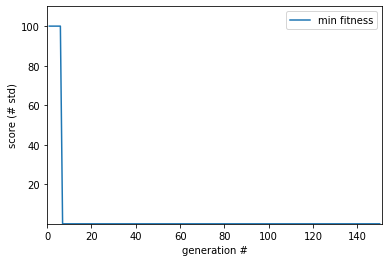

In [10]:


# The optimisation has return us 4 objects: final population, hall of fame, statistical logs and history. 
# 
# The final population contains a list of tuples, with each tuple representing the two parameters of the model


#print('Final population: ', final_pop)


# The best individual found during the optimisation is the first individual of the hall of fame

best_ind = hall_of_fame[0]
#print('Best individual: ', best_ind)
#print('Fitness values: ', best_ind.fitness.values)


# We can evaluate this individual and make use of a convenience function of the cell evaluator to return us a dict of the parameters


best_ind_dict = cell_evaluator.param_dict(best_ind)
#print(cell_evaluator.evaluate_with_dicts(best_ind_dict))


model = cell_evaluator.cell_model
cell_evaluator.param_dict(best_ind)
model.attrs = {str(k):float(v) for k,v in cell_evaluator.param_dict(best_ind).items()}



opt = model.model_to_dtc()
opt.attrs = {str(k):float(v) for k,v in cell_evaluator.param_dict(best_ind).items()}

check_binary_match(target,opt)
inject_and_plot_passive_model(opt,second=target)


# As you can see the evaluation returns the same values as the fitness values provided by the optimisation output. 
# We can have a look at the responses now.

# In[ ]:


#plot_responses(twostep_protocol.run(cell_model=simple_cell, param_values=best_ind_dict, sim=nrn))
 


# Let's have a look at the optimisation statistics.
# We can plot the minimal score (sum of all objective scores) found in every optimisation. 
# The optimisation algorithm uses negative fitness scores, so we actually have to look at the maximum values log.

gen_numbers = logs.select('gen')
min_fitness = logs.select('min')
max_fitness = logs.select('max')
plt.plot(gen_numbers, min_fitness, label='min fitness')
plt.xlabel('generation #')
plt.ylabel('score (# std)')
plt.legend()
plt.xlim(min(gen_numbers) - 1, max(gen_numbers) + 1) 
plt.ylim(0.9*min(min_fitness), 1.1 * max(min_fitness)) 


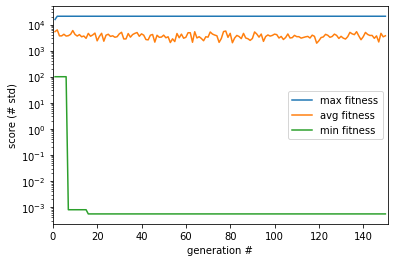

In [11]:
gen_numbers = logs.select('gen')
min_fitness = logs.select('min')
max_fitness = logs.select('max')
avg_fitness = logs.select('avg')

plt.clf()
plt.plot(gen_numbers, max_fitness, label='max fitness')
plt.plot(gen_numbers, avg_fitness, label='avg fitness')
plt.plot(gen_numbers, min_fitness, label='min fitness')

plt.xlabel('generation #')
plt.ylabel('score (# std)')
plt.yscale('log')

plt.legend()
plt.xlim(min(gen_numbers) - 1, max(gen_numbers) + 1) 
#plt.ylim(0.9*min(min_fitness), 1.1 * max(min_fitness)) 
plt.show()


<Figure size 432x288 with 0 Axes>

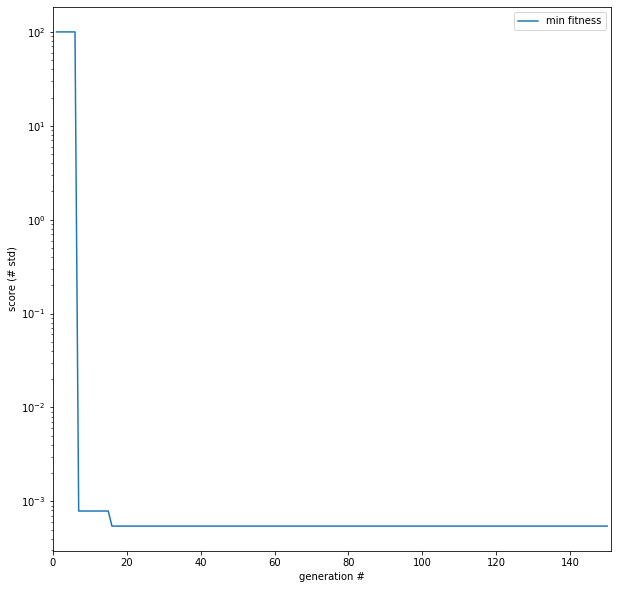

In [12]:
gen_numbers = logs.select('gen')
min_fitness = logs.select('min')
max_fitness = logs.select('max')
avg_fitness = logs.select('avg')

plt.clf()
fig = plt.figure(figsize=(10,10))
#ax = fig.add_subplot(1,1)

plt.plot(gen_numbers, min_fitness, label='min fitness')
#ax.semilogy()
#ax.set_yscale('log')
plt.yscale('log')

plt.xlabel('generation #')
plt.ylabel('score (# std)')
plt.legend()
plt.xlim(min(gen_numbers) - 1, max(gen_numbers) + 1) 
#plt.ylim(0.9*min(min_fitness), 1.1 * max(min_fitness)) 
plt.show()

[-67.40153619] mV [-69.7309259] mV


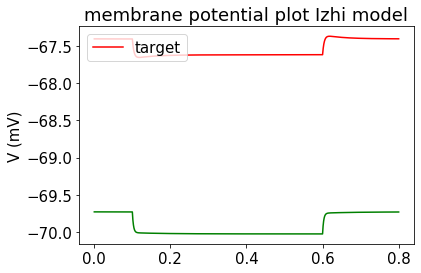

In [13]:
inject_and_plot_passive_model(opt,second=target,plotly=False)
best_ind_dict = cell_evaluator.param_dict(best_ind)
objectives = cell_evaluator.evaluate_with_dicts(best_ind_dict)

In [14]:
best_ind_dict = cell_evaluator.param_dict(best_ind)
objectives = cell_evaluator.evaluate_with_dicts(best_ind_dict)

model = cell_evaluator.cell_model
cell_evaluator.param_dict(best_ind)
model.attrs = {str(k):float(v) for k,v in cell_evaluator.param_dict(best_ind).items()}

opt = model.model_to_dtc()
opt.attrs = {str(k):float(v) for k,v in cell_evaluator.param_dict(best_ind).items()}
from neuronunit.optimisation.optimization_management import dtc_to_rheo, inject_and_plot_model30,check_bin_vm30,check_bin_vm15
opt = dtc_to_rheo(opt)
opt.rheobase
opt.attrs;
vm301,vm151,_,_,target = inject_and_plot_model30(target)
vm302,vm152,_,_,opt = inject_and_plot_model30(opt)


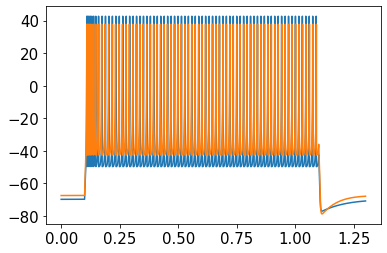

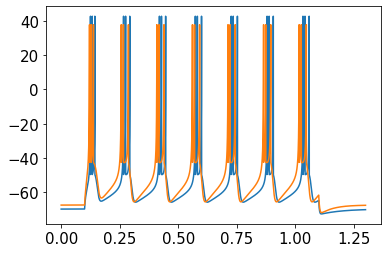

In [15]:
from neuronunit.optimisation.optimization_management import dtc_to_rheo, inject_and_plot_model30,check_bin_vm30,check_bin_vm15
check_bin_vm30(target,opt)
check_bin_vm15(target,opt)






In [16]:
def basic_expVar(trace1, trace2):
    # https://github.com/AllenInstitute/GLIF_Teeter_et_al_2018/blob/master/query_biophys/query_biophys_expVar.py
    '''This is the fundamental calculation that is used in all different types of explained variation.  
    At a basic level, the explained variance is calculated between two traces.  These traces can be PSTH's
    or single spike trains that have been convolved with a kernel (in this case always a Gaussian)
    Input:
        trace 1 & 2:  1D numpy array containing values of the trace.  (This function requires numpy array
                        to ensure that this is not a multidemensional list.)
    Returns:
        expVar:  float value of explained variance
    '''
    
    var_trace1=np.var(trace1)
    var_trace2=np.var(trace2)
    var_trace1_minus_trace2=np.var(trace1-trace2)

    if var_trace1_minus_trace2 == 0.0:
        return 1.0
    else:
        return (var_trace1+var_trace2-var_trace1_minus_trace2)/(var_trace1+var_trace2)
print(basic_expVar(target.vm15, opt.vm15))
print(basic_expVar(target.vm30, opt.vm30))

0.5780733058440687 dimensionless
0.7884157107778248 dimensionless


In [17]:
opt = dtc_to_rheo(opt)
print(opt.rheobase)
print(target.rheobase)


292.060998827219 pA
183.80039613693953 pA


0.37051118942693134 dimensionless variancce explained ratio at rheobase


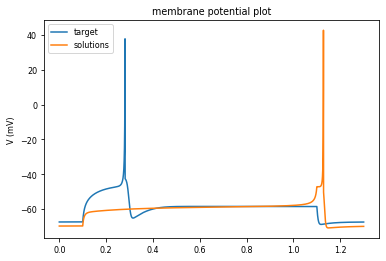

<Figure size 432x288 with 0 Axes>

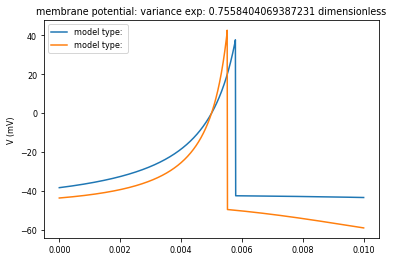

In [18]:

check_binary_match(opt,target,plotly=False,snippets=False)
check_binary_match(opt,target,plotly=False,snippets=True)
print(basic_expVar(target.vmrh, opt.vmrh), 'variancce explained ratio at rheobase')


In [19]:
params = {}
params['injected_square_current'] = {}
#if v.name in str('RestingPotentialTest'):
params['injected_square_current']['delay'] = PASSIVE_DELAY
params['injected_square_current']['duration'] = PASSIVE_DURATION
params['injected_square_current']['amplitude'] = 0.0*pq.pA    

In [20]:

opt_model = opt.dtc_to_model()
opt_model.inject_square_current(params)
opt_vm = opt_model.get_membrane_potential()
opt_vm[-1]

array([-67.40153619]) * mV

In [21]:
target_model = target.dtc_to_model()
target_model.inject_square_current(params)
target_vm = target_model.get_membrane_potential()
target_vm[-1]

array([-69.7309259]) * mV

In [22]:
best_ind = hall_of_fame[1]
#print('Best individual: ', best_ind)
#print('Fitness values: ', best_ind.fitness.values)


# We can evaluate this individual and make use of a convenience function of the cell evaluator to return us a dict of the parameters


best_ind_dict = cell_evaluator.param_dict(best_ind)
#print(cell_evaluator.evaluate_with_dicts(best_ind_dict))


model = cell_evaluator.cell_model
dtc= model.model_to_dtc()
opt = dtc_to_rheo(opt)
print(opt.rheobase)
print(target.rheobase)

292.060998827219 pA
183.80039613693953 pA


In [23]:
#model.rheobase
objectives

{'Spikecount_1.5x': 0.0, 'Spikecount_3.0x': 0.0}

In [24]:

best_ind_dict = cell_evaluator.param_dict(best_ind)
objectives = cell_evaluator.evaluate_with_dicts(best_ind_dict)

In [25]:
import pandas as pd
import seaborn as sns
logbook = logs
#scores = [ m for m in logs ]
'''
list_of_dicts = []
df1 = pd.DataFrame()
genes=[]
for _,v in hist.genealogy_history.items():
    genes.append(v.fitness.values)
for j,i in enumerate(objectives.keys()):
    index = i.split('.')[0]
    df1[str(index)] = pd.Series(genes).values[j]#, index=df1.index)

'''
#MU =14
genes=[]
min_per_generations = []
for i,v in hist.genealogy_history.items():
    if i%MU==0:
        min_per_gen = sorted([(gene,np.min(gene)) for gene in genes],key=lambda x: x[1])
        min_per_generations.append(min_per_gen[0][0])
        genes =[]
    genes.append(v.fitness.values)
    
df2 = pd.DataFrame()
scores = []
for j,i in enumerate(objectives.keys()):
    index = i.split('.')[0]
    print([i[j] for i in min_per_generations ])
    df2[index] = pd.Series([i[j] for i in min_per_generations ])#, index=df1.index)
df2    


[3.744768958867225e-07, 3.744768958867225e-07, 2.000000033789969, 1.147874474376516e-06, 3.744768958867225e-07, 1.147874474376516e-06, 2.762584033224694e-07, 6.000000219515261, 2.000000033789969, 1.147874474376516e-06, 2.762584033224694e-07, 2.0000003586831103, 2.000000033789969, 1.147874474376516e-06, 2.000000033789969, 3.290040872749583e-07, 3.290040872749583e-07, 3.290040872749583e-07, 3.290040872749583e-07, 3.290040872749583e-07, 3.290040872749583e-07, 1.0000003551818737, 3.290040872749583e-07, 3.0000001030185572, 3.290040872749583e-07, 3.0000003270430042, 3.290040872749583e-07, 4.000000238494241, 3.290040872749583e-07, 3.290040872749583e-07, 3.290040872749583e-07, 1.0000003943180715, 1.9122932031630118e-07, 2.000000546878467, 1.9122932031630118e-07, 2.403242101593879e-08, 1.9122932031630118e-07, 1.9122932031630118e-07, 1.9122932031630118e-07, 2.0102569533789406e-07, 1.9122932031630118e-07, 2.000000007955943, 1.9122932031630118e-07, 2.0102569533789406e-07, 1.9122932031630118e-07, 1

,Spikecount_1,Spikecount_3
0,3.744769e-07,1.084969e-07
1,3.744769e-07,1.084969e-07
2,2.000000e+00,2.000000e+00
3,1.147874e-06,1.342972e-08
4,3.744769e-07,1.084969e-07
...,...,...
301,3.174737e-07,1.715018e-07
302,1.147874e-06,1.627692e-07
303,1.912293e-07,1.655612e-07
304,2.418186e-08,2.030102e-07


In [26]:
number=int(np.sqrt(len(df2.columns)))

IndexError: too many indices for array

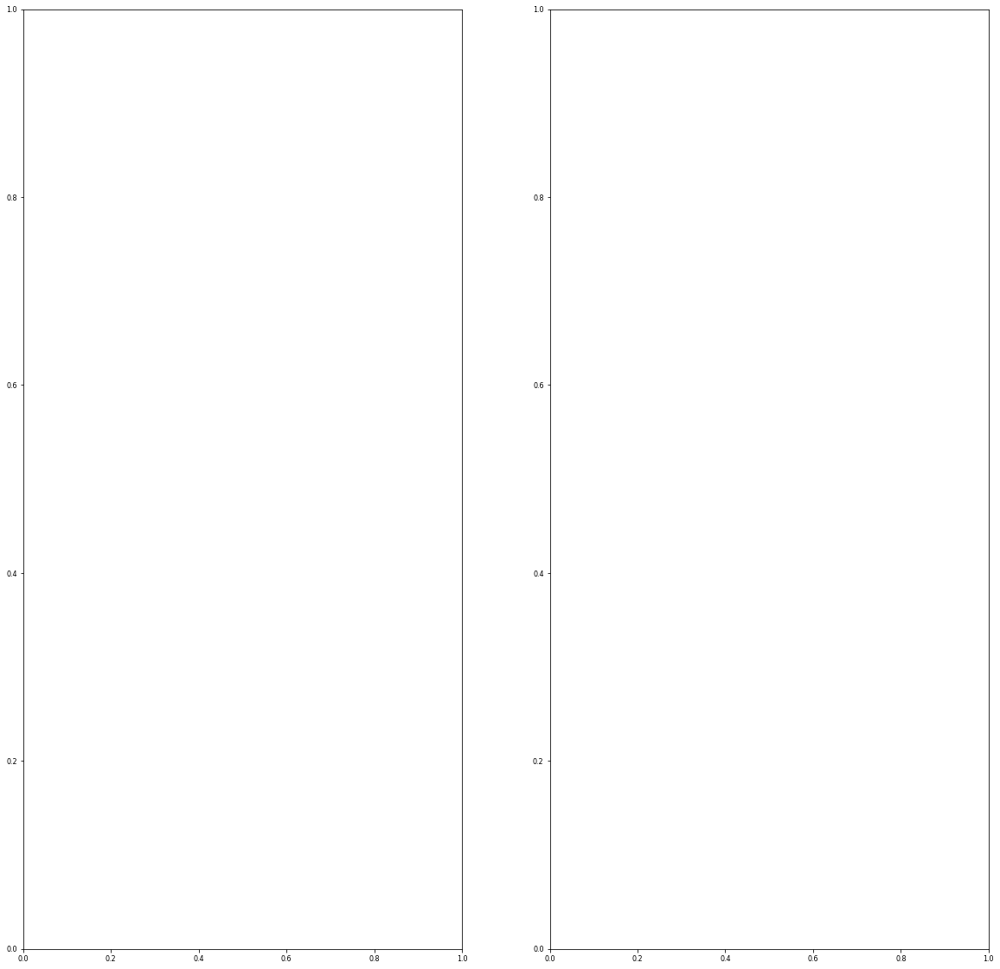

In [27]:
import math
box = int(np.sqrt(len(objectives)))
fig,axes = plt.subplots(box,box+1,figsize=(20,20))#math.ceil(len(objectives)/2+1),figsize=(20,20))
#axes[0,0].plot(scores)
axes[0,0].plot(gen_numbers, min_fitness, label='min fitness')

axes[0,0].set_title('Observation/Prediction Disagreement')
for i,c in enumerate(df2.columns):
    ax = axes.flat[i+1]
    history = df2[c]
    #mn = mean[k.name] 
    #st = std[k.name] 
    #history = [(j[i]-mn)/st for j in scores ]
    #ax.axhline(y=mn , xmin=0.02, xmax=0.99,color='red',label='best candidate sampled')

    #ax.axvline(x=min_x , ymin=0.02, ymax=0.99,color='blue',label='best candidate sampled')
    ax.plot(history)
    ax.set_title(str(c))
    #bigger = np.max([np.max(history),mn])
    #smaller = np.max([np.min(history),mn])

    #ax.set_ylim([np.min(history),np.max(history)])
    #ax.set_ylabel(str(front[0].dtc.tests[i].observation['std'].units))
axes[0,0].set_xlabel("Generation")
axes[0,0].set_ylabel("standardized error")

plt.tight_layout()
#if figname is not None:
#    plt.savefig(figname)
#else:
plt.show()

In [ ]:

logbook = logs
#scores = [ m for m in logs ]
list_of_dicts = []
df1 = pd.DataFrame()
genes=[]
for _,v in hist.genealogy_history.items():
    genes.append(v.fitness.values)
for j,i in enumerate(objectives.keys()):
    index = i.split('.')[0]
    df1[str(index)] = pd.Series(genes).values[j]#, index=df1.index)


    
#if normalize:
#    a = (a - mean(a)) / (std(a) * len(a))
#    v = (v - mean(v)) /  std(v)

df1=(df1-df1.mean())/df1.std()

corr = df1.corr()#.normalize()
fig =plt.figure(figsize=(10,10))
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)#, annot=True)
plt.show()
print(np.sum(np.sum(corr)))

In [ ]:
hist.genealogy_history.keys();

In [ ]:
hist.genealogy_tree.keys();

In [ ]:
import networkx
graph = networkx.DiGraph(hist.genealogy_tree)
graph = graph.reverse()     # Make the graph top-down
per_generation = [(gen,hist.genealogy_history[gen].fitness.values) for gen in graph]

In [ ]:
per_generation

In [ ]:
graph.nodes